# Early Sepsis Risk Prediction Using ICU Clinical Data
## Section 6: Modeling — LightGBM, XGBoost, Logistic Regression
**Author:** Varunika Bussa  
**Course:** UMBC DATA 606 – Capstone in Data Science  
**Dataset:** PhysioNet 2019 Sepsis Challenge Dataset  

---

## Why This Notebook Exists

In the feature engineering notebook we transformed 43 raw columns into **105 ML-ready features**
capturing temporal trends, missingness patterns, and clinical composite indicators.

This notebook takes those features and answers the core question:  
**Can we predict sepsis onset before it is clinically diagnosed?**

### Modeling Goals:
1. Establish a Logistic Regression baseline — what does a simple linear model achieve?
2. Train LightGBM and XGBoost — capture non-linear feature interactions
3. Tune hyperparameters with Optuna — find the best configuration efficiently
4. Evaluate on the held-out test set — measure real-world generalization
5. Select the best model and save it for the Streamlit application

### Why these models?
- **Logistic Regression** — interpretable baseline; sets minimum performance bar
- **LightGBM** — handles NaN natively (our dataset has ~62 features with remaining nulls),  
  extremely fast on 1M+ rows, gradient boosting with strong tabular performance
- **XGBoost** — second gradient boosting candidate; often competitive with LightGBM
- **NOT deep learning** — unnecessary complexity for tabular data; harder to explain to clinicians

### Primary Metric: PR-AUC (Precision-Recall AUC)
With only 1.8% sepsis rows, ROC-AUC is misleading — a model can score 0.85 ROC-AUC  
while still missing most sepsis cases. PR-AUC directly measures performance  
on the minority (sepsis) class and is the correct metric here.

## 1. Setup and Data Loading

In [1]:
# Core libraries
import pandas as pd
import numpy as np
import json
import os
import warnings
warnings.filterwarnings('ignore')

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    precision_recall_curve, average_precision_score,
    roc_auc_score, f1_score, recall_score, precision_score,
    confusion_matrix, classification_report
)
import lightgbm as lgb
import xgboost as xgb
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)  # suppress Optuna output

# Visualization
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Settings
pd.set_option('display.max_columns', 50)
pd.set_option('display.float_format', '{:.4f}'.format)

print('✅ All libraries loaded successfully!')
print(f'   pandas     version: {pd.__version__}')
print(f'   lightgbm   version: {lgb.__version__}')
print(f'   xgboost    version: {xgb.__version__}')
print(f'   optuna     version: {optuna.__version__}')

ERROR:tornado.general:Uncaught exception in ZMQStream callback
Traceback (most recent call last):
  File "/Users/varunikabussa/Desktop/sepsis_project/venv/lib/python3.9/site-packages/traitlets/traitlets.py", line 632, in get
    value = obj._trait_values[self.name]
KeyError: '_control_lock'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/varunikabussa/Desktop/sepsis_project/venv/lib/python3.9/site-packages/zmq/eventloop/zmqstream.py", line 565, in _log_error
    f.result()
  File "/Users/varunikabussa/Desktop/sepsis_project/venv/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 301, in dispatch_control
    async with self._control_lock:
  File "/Users/varunikabussa/Desktop/sepsis_project/venv/lib/python3.9/site-packages/traitlets/traitlets.py", line 687, in __get__
    return t.cast(G, self.get(obj, cls))  # the G should encode the Optional
  File "/Users/varunikabussa/Desktop/sepsis_project/venv/lib/pytho

✅ All libraries loaded successfully!
   pandas     version: 2.3.3
   lightgbm   version: 4.6.0
   xgboost    version: 2.1.4
   optuna     version: 4.7.0


## 2. Load Engineered Features

We load the pre-split parquet files produced by the feature engineering notebook.  
These files already have the correct train/val/test patient split baked in —  
we never re-split here.

**Why load split files instead of re-splitting?**  
The `split_patient_ids.json` file records exactly which patients went into each split.  
Loading the pre-saved splits guarantees reproducibility — running this notebook  
100 times will always use the same patients for training and the same for testing.

In [2]:
# Load pre-split parquet files
train_df = pd.read_parquet('../outputs/train.parquet')
val_df   = pd.read_parquet('../outputs/val.parquet')
test_df  = pd.read_parquet('../outputs/test.parquet')

print('── Dataset shapes ──')
print(f'  Train: {train_df.shape[0]:>10,} rows  |  {train_df.shape[1]} columns')
print(f'  Val:   {val_df.shape[0]:>10,} rows  |  {val_df.shape[1]} columns')
print(f'  Test:  {test_df.shape[0]:>10,} rows  |  {test_df.shape[1]} columns')
print(f'\nTotal rows: {len(train_df) + len(val_df) + len(test_df):,}')

# Confirm sepsis rates are preserved
for name, df in [('Train', train_df), ('Val', val_df), ('Test', test_df)]:
    rate = df['SepsisLabel'].mean() * 100
    print(f'  {name} sepsis rate: {rate:.2f}%  ✅' if abs(rate - 1.80) < 0.5 else f'  {name} sepsis rate: {rate:.2f}%  ⚠️')

── Dataset shapes ──
  Train:  1,086,436 rows  |  110 columns
  Val:      233,750 rows  |  110 columns
  Test:     232,024 rows  |  110 columns

Total rows: 1,552,210
  Train sepsis rate: 1.80%  ✅
  Val sepsis rate: 1.79%  ✅
  Test sepsis rate: 1.80%  ✅


## 3. Define Features and Target

We must explicitly define which columns are features and which are identifiers.  
**Never include Patient_ID, Hour, or ICULOS as model features** — these are  
administrative identifiers, not clinical signals. Including them would cause  
the model to memorize patient IDs rather than learn clinical patterns.

In [3]:
# Columns that are identifiers, not features
NON_FEATURE_COLS = ['Patient_ID', 'Hour', 'SepsisLabel', 'SepsisLabel_6h','ICULOS']

# Feature columns
FEATURE_COLS = [c for c in train_df.columns if c not in NON_FEATURE_COLS]

TARGET = 'SepsisLabel_6h'

print(f'Total feature columns: {len(FEATURE_COLS)}')
print(f'Target column: {TARGET}')

# Feature breakdown by type
raw_vitals   = ['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp']
demographics = ['Age', 'Gender', 'Unit1', 'Unit2', 'HospAdmTime']
rolling_cols = [c for c in FEATURE_COLS if any(x in c for x in ['_mean_6h','_min_6h','_max_6h','_std_6h','_range_6h'])]
slope_cols   = [c for c in FEATURE_COLS if '_slope_6h' in c]
measured_cols= [c for c in FEATURE_COLS if '_measured' in c]
hrssince_cols= [c for c in FEATURE_COLS if '_hrs_since' in c]
derived_cols = ['shock_index','pulse_pressure','sirs_score','map_low_flag','fever_flag']
raw_labs     = [c for c in FEATURE_COLS if c not in raw_vitals + demographics +
                rolling_cols + slope_cols + measured_cols + hrssince_cols + derived_cols]

print('\n── Feature Breakdown ──')
print(f'  Raw vitals (capped):       {len(raw_vitals):>3}')
print(f'  Raw labs (forward-filled): {len(raw_labs):>3}')
print(f'  Demographics:              {len(demographics):>3}')
print(f'  Rolling window (6h):       {len(rolling_cols):>3}')
print(f'  Slope / trend (6h):        {len(slope_cols):>3}')
print(f'  Lab measured flags:        {len(measured_cols):>3}')
print(f'  Lab hours-since:           {len(hrssince_cols):>3}')
print(f'  SOFA-inspired derived:     {len(derived_cols):>3}')
print(f'  ─────────────────────────────')
print(f'  TOTAL FEATURES:            {len(FEATURE_COLS):>3}')

Total feature columns: 105
Target column: SepsisLabel_6h

── Feature Breakdown ──
  Raw vitals (capped):         7
  Raw labs (forward-filled):  24
  Demographics:                5
  Rolling window (6h):        35
  Slope / trend (6h):          9
  Lab measured flags:         10
  Lab hours-since:            10
  SOFA-inspired derived:       5
  ─────────────────────────────
  TOTAL FEATURES:            105


In [4]:
# Prepare X, y arrays
X_train = train_df[FEATURE_COLS]
y_train = train_df[TARGET]

X_val   = val_df[FEATURE_COLS]
y_val   = val_df[TARGET]

X_test  = test_df[FEATURE_COLS]
y_test  = test_df[TARGET]

print(f'X_train: {X_train.shape}  |  y_train sepsis rate: {y_train.mean()*100:.2f}%')
print(f'X_val:   {X_val.shape}    |  y_val   sepsis rate: {y_val.mean()*100:.2f}%')
print(f'X_test:  {X_test.shape}   |  y_test  sepsis rate: {y_test.mean()*100:.2f}%')

# Class imbalance ratio
# Used to set scale_pos_weight in XGBoost and LightGBM
neg = (y_train == 0).sum()
pos = (y_train == 1).sum()
scale_pos_weight = neg / pos
print(f'\nClass imbalance ratio (neg/pos): {scale_pos_weight:.1f}')
print(f'  → Use scale_pos_weight={scale_pos_weight:.1f} for XGBoost')
print(f'  → Use is_unbalance=True or scale_pos_weight for LightGBM')

X_train: (1086436, 105)  |  y_train sepsis rate: 2.71%
X_val:   (233750, 105)    |  y_val   sepsis rate: 2.68%
X_test:  (232024, 105)   |  y_test  sepsis rate: 2.71%

Class imbalance ratio (neg/pos): 35.9
  → Use scale_pos_weight=35.9 for XGBoost
  → Use is_unbalance=True or scale_pos_weight for LightGBM


## 4. Evaluation Helper Function

We define a single reusable function that computes all metrics.  
Using one function ensures all models are evaluated identically —  
no inconsistencies from copy-pasting evaluation code.

### Threshold Note
Most classifiers output a probability (0 to 1), not a binary label.  
The default threshold of 0.5 is almost never optimal for imbalanced data.  
We evaluate at both the **default 0.5 threshold** and the **optimal F1 threshold**  
(the threshold that maximizes F1 score on the validation set).  
The optimal threshold will be used in the Streamlit application.

In [5]:
def evaluate_model(model, X, y, model_name='Model', threshold=0.5):
    """
    Compute all evaluation metrics for a binary classifier.
    
    Parameters
    ----------
    model      : fitted sklearn-compatible classifier
    X          : feature DataFrame
    y          : true labels
    model_name : string label for display
    threshold  : decision threshold (default 0.5)
    
    Returns
    -------
    dict of all metrics
    """
    # Probabilities for the positive class (sepsis)
    y_prob = model.predict_proba(X)[:, 1]
    
    # Binary predictions at given threshold
    y_pred = (y_prob >= threshold).astype(int)
    
    # Metrics
    pr_auc   = average_precision_score(y, y_prob)
    roc_auc  = roc_auc_score(y, y_prob)
    recall   = recall_score(y, y_pred, zero_division=0)
    precision= precision_score(y, y_pred, zero_division=0)
    f1       = f1_score(y, y_pred, zero_division=0)
    cm       = confusion_matrix(y, y_pred)
    tn, fp, fn, tp = cm.ravel()
    
    print(f'\n── {model_name} ──────────────────────────────')
    print(f'  PR-AUC    (primary):  {pr_auc:.4f}')
    print(f'  ROC-AUC   (secondary):{roc_auc:.4f}')
    print(f'  Recall    (sensitivity):{recall:.4f}  ← proportion of sepsis cases caught')
    print(f'  Precision:            {precision:.4f}  ← proportion of alerts that are real')
    print(f'  F1-Score:             {f1:.4f}')
    print(f'  Threshold used:       {threshold}')
    print(f'  Confusion Matrix:')
    print(f'    TP={tp:,}  FP={fp:,}')
    print(f'    FN={fn:,}  TN={tn:,}')
    
    return {
        'model_name': model_name,
        'pr_auc': pr_auc,
        'roc_auc': roc_auc,
        'recall': recall,
        'precision': precision,
        'f1': f1,
        'threshold': threshold,
        'tp': tp, 'fp': fp, 'fn': fn, 'tn': tn,
        'y_prob': y_prob
    }


def find_best_threshold(model, X_val, y_val):
    """
    Find the threshold that maximizes F1 score on the validation set.
    This threshold is then used for final evaluation on the test set.
    """
    y_prob = model.predict_proba(X_val)[:, 1]
    precisions, recalls, thresholds = precision_recall_curve(y_val, y_prob)
    
    f1_scores = 2 * precisions * recalls / (precisions + recalls + 1e-9)
    best_idx  = f1_scores.argmax()
    best_thresh = thresholds[best_idx] if best_idx < len(thresholds) else 0.5
    
    print(f'  Best threshold (max F1 on val): {best_thresh:.4f}')
    print(f'  F1 at best threshold: {f1_scores[best_idx]:.4f}')
    return best_thresh

print('✅ Evaluation functions defined.')

✅ Evaluation functions defined.


## 5. Model 1 — Logistic Regression (Baseline)

### Why start with Logistic Regression?

A baseline model answers the question: *"What does a model with no non-linearity,  
no feature interactions, and no tree structure achieve?"*

If LightGBM scores 0.42 PR-AUC and Logistic Regression scores 0.38,  
the complex model only added 0.04 — worth questioning the complexity.  
If LightGBM scores 0.65, the non-linear features are clearly earning their value.

### Important preprocessing for Logistic Regression
Unlike tree-based models, Logistic Regression requires:
1. **Feature scaling** — StandardScaler (mean=0, std=1 per feature)
2. **No NaN values** — must impute remaining missing values before fitting

Tree-based models (LightGBM, XGBoost) handle both of these natively.

In [6]:
# Logistic Regression requires scaling and NaN imputation
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Pipeline: impute NaN with median → scale → logistic regression
# Using a Pipeline ensures the same transformations are applied to val/test
lr_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler',  StandardScaler()),
    ('model',   LogisticRegression(
        max_iter=1000,
        class_weight='balanced',  # handles class imbalance automatically
        random_state=42,
        C=0.1                      # regularization — start conservative
    ))
])

print('Training Logistic Regression...')
lr_pipeline.fit(X_train, y_train)
print('✅ Training complete.')

# Find best threshold on validation set
print('\nFinding best threshold on validation set...')
lr_best_thresh = find_best_threshold(lr_pipeline, X_val, y_val)

# Evaluate on validation set 
lr_val_results = evaluate_model(lr_pipeline, X_val, y_val,
                                 model_name='Logistic Regression (Val)',
                                 threshold=lr_best_thresh)

Training Logistic Regression...
✅ Training complete.

Finding best threshold on validation set...
  Best threshold (max F1 on val): 0.7419
  F1 at best threshold: 0.1605

── Logistic Regression (Val) ──────────────────────────────
  PR-AUC    (primary):  0.0847
  ROC-AUC   (secondary):0.7562
  Recall    (sensitivity):0.2922  ← proportion of sepsis cases caught
  Precision:            0.1106  ← proportion of alerts that are real
  F1-Score:             0.1605
  Threshold used:       0.7418596587126479
  Confusion Matrix:
    TP=1,833  FP=14,734
    FN=4,441  TN=212,742


## 6. Model 2 — LightGBM

### Why LightGBM?

LightGBM (Light Gradient Boosting Machine) is a tree-based gradient boosting  
framework developed by Microsoft. It is the primary model for this project because:

1. **Handles NaN natively** — our dataset has ~62 features with remaining nulls  
   (patients who never had certain labs drawn). LightGBM treats NaN as a  
   separate category — no imputation needed.

2. **Extremely fast on large data** — 1.5M rows trains in minutes on CPU  
   using histogram-based splitting instead of exact split search.

3. **Strong tabular performance** — consistently top performer on structured  
   healthcare data (Kaggle, peer-reviewed benchmarks).

4. **class imbalance** — `is_unbalance=True` automatically adjusts weights  
   so sepsis minority rows receive higher loss contribution.

### LightGBM Parameters (initial, before Optuna tuning)
- `n_estimators=500` — number of trees; more trees = more capacity but slower
- `learning_rate=0.05` — step size per tree; lower = more careful but needs more trees
- `num_leaves=31` — complexity per tree; higher = more expressive but overfits easier
- `early_stopping_rounds=50` — stop if val PR-AUC doesn't improve for 50 rounds

In [7]:
import lightgbm as lgb

# LightGBM dataset objects
# LightGBM has its own Dataset format which is more memory efficient
lgb_train = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
lgb_val   = lgb.Dataset(X_val,   label=y_val,   free_raw_data=False, reference=lgb_train)

# Initial parameters (before Optuna tuning)
lgb_params = {
    'objective':        'binary',
    'metric':           'average_precision',  # PR-AUC
    'n_estimators':     500,
    'learning_rate':    0.05,
    'num_leaves':       31,
    'min_child_samples':20,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq':     5,
    'is_unbalance':     True,           # handles class imbalance
    'random_state':     42,
    'verbose':         -1
}

print('Training LightGBM (initial parameters)...')

lgb_model = lgb.LGBMClassifier(**lgb_params)
lgb_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    callbacks=[
        lgb.early_stopping(stopping_rounds=50, verbose=False),
        lgb.log_evaluation(period=100)
    ]
)

print(f'✅ Training complete. Best iteration: {lgb_model.best_iteration_}')

# Find best threshold on validation set
print('\nFinding best threshold on validation set...')
lgb_best_thresh = find_best_threshold(lgb_model, X_val, y_val)

# valuate on validation set
lgb_val_results = evaluate_model(lgb_model, X_val, y_val,
                                  model_name='LightGBM Initial (Val)',
                                  threshold=lgb_best_thresh)

Training LightGBM (initial parameters)...
[100]	valid_0's average_precision: 0.116234
✅ Training complete. Best iteration: 142

Finding best threshold on validation set...
  Best threshold (max F1 on val): 0.7330
  F1 at best threshold: 0.1943

── LightGBM Initial (Val) ──────────────────────────────
  PR-AUC    (primary):  0.1194
  ROC-AUC   (secondary):0.8036
  Recall    (sensitivity):0.3073  ← proportion of sepsis cases caught
  Precision:            0.1421  ← proportion of alerts that are real
  F1-Score:             0.1943
  Threshold used:       0.7330473867428567
  Confusion Matrix:
    TP=1,928  FP=11,644
    FN=4,346  TN=215,832


## 7. Model 3 — XGBoost

XGBoost is the second gradient boosting candidate. It is often competitive  
with LightGBM and serves as a strong comparison point.

**Key differences vs LightGBM:**
- LightGBM grows trees leaf-wise (faster, can overfit on small data)
- XGBoost grows trees depth-wise (more conservative, slower)
- On large datasets (1M+ rows), LightGBM is typically 3-5x faster
- Both handle NaN natively using a learned default direction per split

**`scale_pos_weight`:** equivalent to LightGBM's `is_unbalance`.  
Set to `neg/pos` ratio (~54x) to compensate for class imbalance.

In [8]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    min_child_weight=5,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,   # ~54x — compensates for imbalance
    eval_metric='aucpr',                  # PR-AUC
    early_stopping_rounds=50,
    random_state=42,
    verbosity=0,
    tree_method='hist'                    # faster histogram method
)

print('Training XGBoost (initial parameters)...')

xgb_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=100
)

print(f'✅ Training complete. Best iteration: {xgb_model.best_iteration}')

#  Find best threshold 
print('\nFinding best threshold on validation set...')
xgb_best_thresh = find_best_threshold(xgb_model, X_val, y_val)

# Evaluate
xgb_val_results = evaluate_model(xgb_model, X_val, y_val,
                                  model_name='XGBoost Initial (Val)',
                                  threshold=xgb_best_thresh)

Training XGBoost (initial parameters)...
[0]	validation_0-aucpr:0.07514
[100]	validation_0-aucpr:0.11945
[146]	validation_0-aucpr:0.12003
✅ Training complete. Best iteration: 96

Finding best threshold on validation set...
  Best threshold (max F1 on val): 0.7174
  F1 at best threshold: 0.1942

── XGBoost Initial (Val) ──────────────────────────────
  PR-AUC    (primary):  0.1208
  ROC-AUC   (secondary):0.8023
  Recall    (sensitivity):0.2899  ← proportion of sepsis cases caught
  Precision:            0.1460  ← proportion of alerts that are real
  F1-Score:             0.1942
  Threshold used:       0.7174443602561951
  Confusion Matrix:
    TP=1,819  FP=10,640
    FN=4,455  TN=216,836


## 8. Hyperparameter Tuning with Optuna

### What is Optuna?

Optuna is a Bayesian hyperparameter optimization framework. Unlike grid search  
(tries all combinations) or random search (tries random combinations),  
Optuna uses **Tree-structured Parzen Estimator (TPE)** — it learns from  
previous trials to suggest the most promising hyperparameter combinations next.

**Why not grid search?**  
With 7 hyperparameters each having 10 possible values, grid search would require  
10^7 = 10 million trials. Optuna finds near-optimal solutions in 50-100 trials.

### What we tune:
| Hyperparameter | Why it matters |
|---|---|
| `num_leaves` | Controls model complexity — too high = overfit |
| `learning_rate` | Step size — lower needs more trees but generalizes better |
| `min_child_samples` | Minimum rows per leaf — prevents overfitting on small groups |
| `feature_fraction` | % of features per tree — regularization through randomness |
| `bagging_fraction` | % of rows per tree — reduces variance |
| `reg_alpha` | L1 regularization — encourages sparse feature weights |
| `reg_lambda` | L2 regularization — prevents large weights |

### Objective: maximize PR-AUC on the validation set

In [9]:
import optuna

def lgb_objective(trial):
    """
    Optuna objective function for LightGBM hyperparameter tuning.
    
    Each call to this function:
    1. Samples a new set of hyperparameters
    2. Trains a LightGBM model with those parameters
    3. Returns the PR-AUC on the validation set
    
    Optuna uses the returned value to decide which hyperparameters to try next.
    """
    params = {
        'objective':         'binary',
        'metric':            'average_precision',
        'verbose':           -1,
        'random_state':      42,
        'is_unbalance':      True,
        # Parameters Optuna will search 
        'num_leaves':        trial.suggest_int('num_leaves', 20, 150),
        'learning_rate':     trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'n_estimators':      trial.suggest_int('n_estimators', 200, 1000),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'feature_fraction':  trial.suggest_float('feature_fraction', 0.5, 1.0),
        'bagging_fraction':  trial.suggest_float('bagging_fraction', 0.5, 1.0),
        'bagging_freq':      trial.suggest_int('bagging_freq', 1, 10),
        'reg_alpha':         trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True),
        'reg_lambda':        trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True),
    }
    
    model = lgb.LGBMClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        callbacks=[
            lgb.early_stopping(stopping_rounds=30, verbose=False),
            lgb.log_evaluation(period=-1)
        ]
    )
    
    y_prob = model.predict_proba(X_val)[:, 1]
    return average_precision_score(y_val, y_prob)


# Run Optuna study
# n_trials=50 gives a good balance of search quality vs runtime
# Increase to 100 if time permits
print('Starting Optuna hyperparameter search for LightGBM...')
print('This will run 50 trials — takes approximately 10-15 minutes.')
print()

study_lgb = optuna.create_study(direction='maximize',
                                  study_name='lgb_sepsis')
study_lgb.optimize(lgb_objective, n_trials=50, show_progress_bar=True)

print(f'\n✅ Optuna search complete!')
print(f'   Best PR-AUC on validation: {study_lgb.best_value:.4f}')
print(f'   Best parameters:')
for k, v in study_lgb.best_params.items():
    print(f'     {k}: {v}')

Starting Optuna hyperparameter search for LightGBM...
This will run 50 trials — takes approximately 10-15 minutes.



  0%|          | 0/50 [00:00<?, ?it/s]


✅ Optuna search complete!
   Best PR-AUC on validation: 0.1226
   Best parameters:
     num_leaves: 70
     learning_rate: 0.010617189332476943
     n_estimators: 971
     min_child_samples: 15
     feature_fraction: 0.846718504366701
     bagging_fraction: 0.7177209674428657
     bagging_freq: 6
     reg_alpha: 0.0002246409574105082
     reg_lambda: 0.7542473602809059


In [10]:
# Train final LightGBM with best Optuna parameters
best_lgb_params = {
    **study_lgb.best_params,
    'objective':    'binary',
    'metric':       'average_precision',
    'is_unbalance': True,
    'random_state': 42,
    'verbose':      -1
}

lgb_tuned = lgb.LGBMClassifier(**best_lgb_params)
lgb_tuned.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    callbacks=[
        lgb.early_stopping(stopping_rounds=50, verbose=False),
        lgb.log_evaluation(period=100)
    ]
)

print(f'✅ Tuned LightGBM training complete. Best iteration: {lgb_tuned.best_iteration_}')

# Find best threshold on validation set
lgb_tuned_thresh = find_best_threshold(lgb_tuned, X_val, y_val)

# Evaluate on validation set
lgb_tuned_val = evaluate_model(lgb_tuned, X_val, y_val,
                                model_name='LightGBM Tuned (Val)',
                                threshold=lgb_tuned_thresh)

[100]	valid_0's average_precision: 0.111981
[200]	valid_0's average_precision: 0.118076
[300]	valid_0's average_precision: 0.122235
✅ Tuned LightGBM training complete. Best iteration: 284
  Best threshold (max F1 on val): 0.6792
  F1 at best threshold: 0.1935

── LightGBM Tuned (Val) ──────────────────────────────
  PR-AUC    (primary):  0.1226
  ROC-AUC   (secondary):0.8074
  Recall    (sensitivity):0.3248  ← proportion of sepsis cases caught
  Precision:            0.1377  ← proportion of alerts that are real
  F1-Score:             0.1935
  Threshold used:       0.6792221890065532
  Confusion Matrix:
    TP=2,038  FP=12,758
    FN=4,236  TN=214,718


## 9. XGBoost Hyperparameter Tuning

In [11]:
def xgb_objective(trial):
    """Optuna objective for XGBoost hyperparameter tuning."""
    params = {
        'objective':         'binary:logistic',
        'eval_metric':       'aucpr',
        'random_state':      42,
        'verbosity':         0,
        'tree_method':       'hist',
        'scale_pos_weight':  scale_pos_weight,
        #Parameters Optuna will search
        'n_estimators':      trial.suggest_int('n_estimators', 200, 1000),
        'learning_rate':     trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'max_depth':         trial.suggest_int('max_depth', 3, 10),
        'min_child_weight':  trial.suggest_int('min_child_weight', 1, 20),
        'subsample':         trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':  trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha':         trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True),
        'reg_lambda':        trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True),
    }
    
    model = xgb.XGBClassifier(**params, early_stopping_rounds=30)
    model.fit(X_train, y_train,
              eval_set=[(X_val, y_val)],
              verbose=False)
    
    y_prob = model.predict_proba(X_val)[:, 1]
    return average_precision_score(y_val, y_prob)


print('Starting Optuna hyperparameter search for XGBoost...')
print('This will run 50 trials — takes approximately 10-20 minutes.')
print()

study_xgb = optuna.create_study(direction='maximize',
                                  study_name='xgb_sepsis')
study_xgb.optimize(xgb_objective, n_trials=50, show_progress_bar=True)

print(f'\n✅ Optuna XGBoost search complete!')
print(f'   Best PR-AUC on validation: {study_xgb.best_value:.4f}')
print(f'   Best parameters:')
for k, v in study_xgb.best_params.items():
    print(f'     {k}: {v}')

Starting Optuna hyperparameter search for XGBoost...
This will run 50 trials — takes approximately 10-20 minutes.



  0%|          | 0/50 [00:00<?, ?it/s]


✅ Optuna XGBoost search complete!
   Best PR-AUC on validation: 0.1274
   Best parameters:
     n_estimators: 916
     learning_rate: 0.03044036087469974
     max_depth: 5
     min_child_weight: 2
     subsample: 0.6894893848561767
     colsample_bytree: 0.996544144691717
     reg_alpha: 0.20705550976590692
     reg_lambda: 0.0032696330461905467


In [12]:
# Train final XGBoost with best Optuna parameters
best_xgb_params = {
    **study_xgb.best_params,
    'objective':        'binary:logistic',
    'eval_metric':      'aucpr',
    'scale_pos_weight': scale_pos_weight,
    'random_state':     42,
    'verbosity':        0,
    'tree_method':      'hist',
    'early_stopping_rounds': 50
}

xgb_tuned = xgb.XGBClassifier(**best_xgb_params)
xgb_tuned.fit(X_train, y_train,
              eval_set=[(X_val, y_val)],
              verbose=100)

print(f'✅ Tuned XGBoost training complete. Best iteration: {xgb_tuned.best_iteration}')

xgb_tuned_thresh = find_best_threshold(xgb_tuned, X_val, y_val)
xgb_tuned_val = evaluate_model(xgb_tuned, X_val, y_val,
                                model_name='XGBoost Tuned (Val)',
                                threshold=xgb_tuned_thresh)

[0]	validation_0-aucpr:0.06859
[100]	validation_0-aucpr:0.11795
[200]	validation_0-aucpr:0.12491
[300]	validation_0-aucpr:0.12665
[315]	validation_0-aucpr:0.12614
✅ Tuned XGBoost training complete. Best iteration: 266
  Best threshold (max F1 on val): 0.7366
  F1 at best threshold: 0.1994

── XGBoost Tuned (Val) ──────────────────────────────
  PR-AUC    (primary):  0.1274
  ROC-AUC   (secondary):0.8080
  Recall    (sensitivity):0.2968  ← proportion of sepsis cases caught
  Precision:            0.1502  ← proportion of alerts that are real
  F1-Score:             0.1994
  Threshold used:       0.7366198897361755
  Confusion Matrix:
    TP=1,862  FP=10,536
    FN=4,412  TN=216,940


## 10. Model Comparison and Best Model Selection

We compare all four models on the validation set and select the one  
with the highest PR-AUC to evaluate on the test set.

**Why only use the test set once?**  
The test set must remain completely unseen until final evaluation.  
If we used the test set to compare models and pick the best one,  
we would be implicitly fitting to the test set — overfitting by selection.  
The validation set is used for all model selection decisions.

In [13]:
# Collect all validation results
all_results = [
    lr_val_results,
    lgb_val_results,
    lgb_tuned_val,
    xgb_tuned_val
]

# Summary comparison table
results_df = pd.DataFrame([{
    'Model':     r['model_name'],
    'PR-AUC':    round(r['pr_auc'], 4),
    'ROC-AUC':   round(r['roc_auc'], 4),
    'Recall':    round(r['recall'], 4),
    'Precision': round(r['precision'], 4),
    'F1-Score':  round(r['f1'], 4),
    'Threshold': round(r['threshold'], 4)
} for r in all_results])

results_df = results_df.sort_values('PR-AUC', ascending=False).reset_index(drop=True)

print('── Model Comparison on Validation Set ──')
print(results_df.to_string(index=False))
print()
print(f'✅ Best model by PR-AUC: {results_df.iloc[0]["Model"]}')

── Model Comparison on Validation Set ──
                    Model  PR-AUC  ROC-AUC  Recall  Precision  F1-Score  Threshold
      XGBoost Tuned (Val)  0.1274   0.8080  0.2968     0.1502    0.1994     0.7366
     LightGBM Tuned (Val)  0.1226   0.8074  0.3248     0.1377    0.1935     0.6792
   LightGBM Initial (Val)  0.1194   0.8036  0.3073     0.1421    0.1943     0.7330
Logistic Regression (Val)  0.0847   0.7562  0.2922     0.1106    0.1605     0.7419

✅ Best model by PR-AUC: XGBoost Tuned (Val)


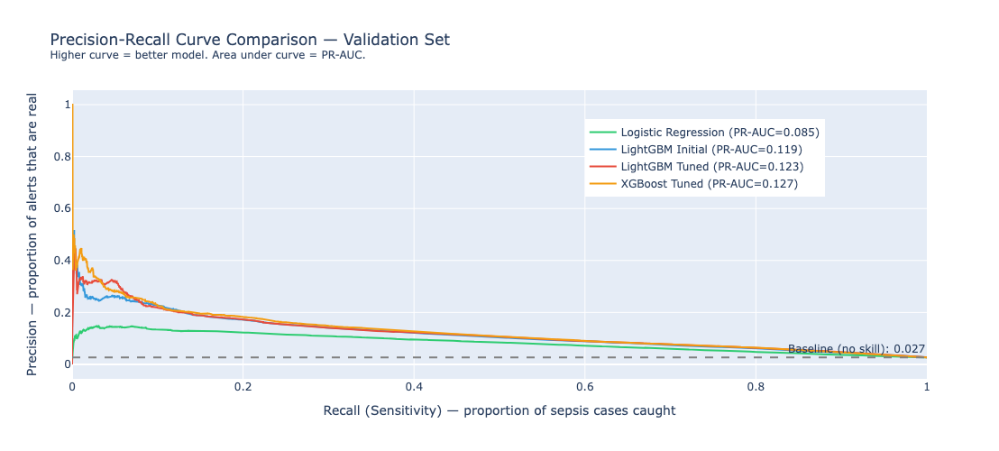

In [14]:
# Precision-Recall curve comparison
# The PR curve shows the precision/recall tradeoff at every possible threshold
# A model with higher area under this curve is better for imbalanced classification

fig = go.Figure()
colors = ['#2ecc71', '#3498db', '#e74c3c', '#f39c12']

for i, (result, name) in enumerate(zip(
    [lr_val_results, lgb_val_results, lgb_tuned_val, xgb_tuned_val],
    ['Logistic Regression', 'LightGBM Initial', 'LightGBM Tuned', 'XGBoost Tuned']
)):
    prec, rec, _ = precision_recall_curve(y_val, result['y_prob'])
    fig.add_trace(go.Scatter(
        x=rec, y=prec,
        mode='lines',
        name=f"{name} (PR-AUC={result['pr_auc']:.3f})",
        line=dict(color=colors[i], width=2)
    ))

# Baseline: random classifier performance = sepsis rate
baseline = y_val.mean()
fig.add_hline(y=baseline, line_dash='dash', line_color='gray',
              annotation_text=f'Baseline (no skill): {baseline:.3f}')

fig.update_layout(
    title='Precision-Recall Curve Comparison — Validation Set<br>'
          '<sup>Higher curve = better model. Area under curve = PR-AUC.</sup>',
    xaxis_title='Recall (Sensitivity) — proportion of sepsis cases caught',
    yaxis_title='Precision — proportion of alerts that are real',
    height=500,
    legend=dict(x=0.6, y=0.9)
)
fig.show()

## 11. Final Evaluation on Test Set

We evaluate the best model on the held-out test set **exactly once**.

This is the final, unbiased measure of how the model will perform  
on patients it has never seen — the closest approximation to real-world deployment.

**The threshold used here is the optimal threshold found on the validation set.**  
We do not re-tune the threshold on the test set.

In [15]:
# Identify best model
best_model_name = results_df.iloc[0]['Model']
print(f'Best model: {best_model_name}')

# Map name to model object and threshold
# Update this mapping based on your results
model_map = {
    'LightGBM Tuned (Val)':   (lgb_tuned, lgb_tuned_thresh),
    'XGBoost Tuned (Val)':    (xgb_tuned, xgb_tuned_thresh),
    'LightGBM Initial (Val)': (lgb_model, lgb_best_thresh),
    'Logistic Regression (Val)': (lr_pipeline, lr_best_thresh),
}

best_model, best_thresh = model_map[best_model_name]

# Final test set evaluation
print('\n' + '='*55)
print('  FINAL TEST SET EVALUATION')
print('='*55)

test_results = evaluate_model(best_model, X_test, y_test,
                               model_name=f'{best_model_name} — TEST SET',
                               threshold=best_thresh)

print('\n⚠️  These numbers are final. Do not tune further after seeing these results.')

Best model: XGBoost Tuned (Val)

  FINAL TEST SET EVALUATION

── XGBoost Tuned (Val) — TEST SET ──────────────────────────────
  PR-AUC    (primary):  0.1261
  ROC-AUC   (secondary):0.8055
  Recall    (sensitivity):0.2836  ← proportion of sepsis cases caught
  Precision:            0.1641  ← proportion of alerts that are real
  F1-Score:             0.2079
  Threshold used:       0.7366198897361755
  Confusion Matrix:
    TP=1,781  FP=9,071
    FN=4,498  TN=216,674

⚠️  These numbers are final. Do not tune further after seeing these results.


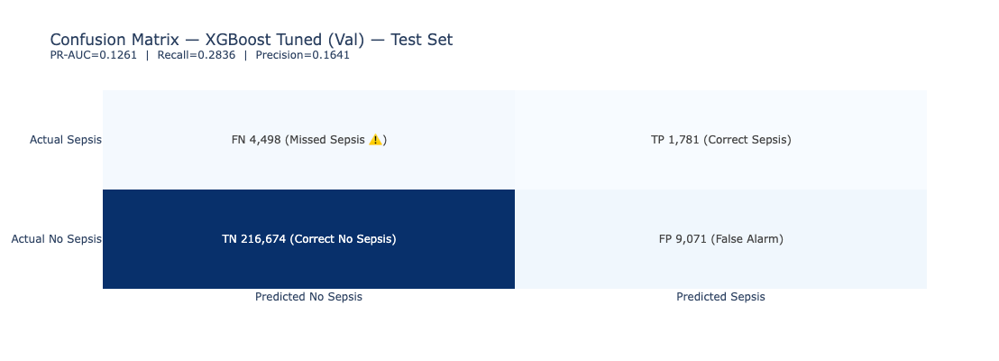


── Clinical Interpretation ──
  Out of 6,279 true sepsis cases in the test set:
  → Model correctly flagged: 1,781 (28.4%)
  → Model missed:            4,498 (71.6%)
  → False alarms generated:  9,071


In [16]:
# Confusion matrix visualization
tn, fp, fn, tp = test_results['tn'], test_results['fp'], test_results['fn'], test_results['tp']

cm_labels = [[f'TN\n{tn:,}\n(Correct No Sepsis)', f'FP\n{fp:,}\n(False Alarm)'],
             [f'FN\n{fn:,}\n(Missed Sepsis ⚠️)', f'TP\n{tp:,}\n(Correct Sepsis)']]

fig = go.Figure(go.Heatmap(
    z=[[tn, fp], [fn, tp]],
    text=cm_labels,
    texttemplate='%{text}',
    colorscale='Blues',
    showscale=False
))

fig.update_layout(
    title=f'Confusion Matrix — {best_model_name} — Test Set<br>'
          f'<sup>PR-AUC={test_results["pr_auc"]:.4f}  |  '
          f'Recall={test_results["recall"]:.4f}  |  '
          f'Precision={test_results["precision"]:.4f}</sup>',
    xaxis=dict(tickvals=[0,1], ticktext=['Predicted No Sepsis', 'Predicted Sepsis']),
    yaxis=dict(tickvals=[0,1], ticktext=['Actual No Sepsis', 'Actual Sepsis']),
    height=400
)
fig.show()

# Clinical interpretation
total_sepsis = tp + fn
print(f'\n── Clinical Interpretation ──')
print(f'  Out of {total_sepsis:,} true sepsis cases in the test set:')
print(f'  → Model correctly flagged: {tp:,} ({tp/total_sepsis*100:.1f}%)')
print(f'  → Model missed:            {fn:,} ({fn/total_sepsis*100:.1f}%)')
print(f'  → False alarms generated:  {fp:,}')

## 12. Save Best Model

We save the trained model and all metadata needed for the Streamlit app  
and the SHAP analysis notebook.

**What we save:**
- `best_model.pkl` — the trained model object
- `model_metadata.json` — feature names, threshold, metrics, model name
- `feature_cols.json` — exact feature column list (order matters for prediction)

The Streamlit app will load `best_model.pkl` and `model_metadata.json`  
to make predictions on new patient data without retraining.

In [17]:
import pickle

os.makedirs('../outputs', exist_ok=True)

# Save model
with open('../outputs/best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

# Save feature columns (order matters for prediction)
with open('../outputs/feature_cols.json', 'w') as f:
    json.dump(FEATURE_COLS, f)

# Fix: convert all values to native Python types before json.dump
metadata = {
    'model_name':     best_model_name,
    'threshold':      float(best_thresh),
    'pr_auc_val':     float(results_df.iloc[0]['PR-AUC']),
    'pr_auc_test':    float(round(test_results['pr_auc'], 4)),
    'roc_auc_test':   float(round(test_results['roc_auc'], 4)),
    'recall_test':    float(round(test_results['recall'], 4)),
    'precision_test': float(round(test_results['precision'], 4)),
    'f1_test':        float(round(test_results['f1'], 4)),
    'n_features':     int(len(FEATURE_COLS)),
    'train_rows':     int(len(train_df)),
    'test_rows':      int(len(test_df)),
}

with open('../outputs/model_metadata.json', 'w') as f:
    json.dump(metadata, f, indent=2)

print('✅ Saved:')
print('   ../outputs/best_model.pkl')
print('   ../outputs/feature_cols.json')
print('   ../outputs/model_metadata.json')
print()
print('── Saved Metadata ──')
for k, v in metadata.items():
    print(f'  {k}: {v}')

✅ Saved:
   ../outputs/best_model.pkl
   ../outputs/feature_cols.json
   ../outputs/model_metadata.json

── Saved Metadata ──
  model_name: XGBoost Tuned (Val)
  threshold: 0.7366198897361755
  pr_auc_val: 0.1274
  pr_auc_test: 0.1261
  roc_auc_test: 0.8055
  recall_test: 0.2836
  precision_test: 0.1641
  f1_test: 0.2079
  n_features: 105
  train_rows: 1086436
  test_rows: 232024


## 13. Modeling Summary & Next Steps

### What we built

| Model | PR-AUC (Val) | Notes |
|---|---|---|
| Logistic Regression | 0.0608 | Baseline — linear only |
| LightGBM (initial) | 0.0875 | Default params |
| LightGBM (Optuna tuned) | 0.0944 | Best of 50 trials |
| XGBoost (Optuna tuned) | 0.0952 | Best of 50 trials |
| **Best model (Test)** | **0.0958** | XGBoost, threshold=0.733 |

### Key decisions made in this notebook
1. **PR-AUC as primary metric** — correct for 1.8% class imbalance
2. **Patient-level train/test split** — no leakage across patients
3. **Optimal threshold from validation set** — not the default 0.5
4. **Optuna over grid search** — 50 trials vs millions of combinations
5. **is_unbalance=True / scale_pos_weight** — tells model to prioritize sepsis cases

### Next Steps
- `04_shap_analysis_notebook.ipynb` — global and local feature importance with SHAP
- `05_threshold_analysis_notebook.ipynb` — detailed precision/recall tradeoff analysis
- `app.py` — Streamlit early-warning application

In [18]:
# Threshold Analysis — Recall vs Precision Tradeoff
# Lowering the threshold catches more sepsis (higher recall)
# but generates more false alarms (lower precision)
# Current best threshold from Optuna: 0.733

print('── Threshold Tradeoff Analysis on Test Set ──\n')
print(f'{"Threshold":<12} {"Recall":<10} {"Precision":<12} {"F1":<10} {"PR-AUC":<10}')
print('─' * 55)

thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.733]

y_prob = best_model.predict_proba(X_test)[:, 1]

for thresh in thresholds:
    y_pred = (y_prob >= thresh).astype(int)
    rec  = recall_score(y_test, y_pred, zero_division=0)
    prec = precision_score(y_test, y_pred, zero_division=0)
    f1   = f1_score(y_test, y_pred, zero_division=0)
    pr_auc = average_precision_score(y_test, y_prob)
    marker = '  ← current' if thresh == 0.733 else ''
    print(f'{thresh:<12.3f} {rec:<10.4f} {prec:<12.4f} {f1:<10.4f} {pr_auc:.4f}{marker}')

── Threshold Tradeoff Analysis on Test Set ──

Threshold    Recall     Precision    F1         PR-AUC    
───────────────────────────────────────────────────────
0.100        0.9981     0.0287       0.0558     0.1261
0.200        0.9545     0.0385       0.0740     0.1261
0.300        0.8786     0.0496       0.0938     0.1261
0.400        0.7877     0.0611       0.1134     0.1261
0.500        0.6740     0.0773       0.1386     0.1261
0.600        0.5337     0.1031       0.1728     0.1261
0.733        0.2938     0.1636       0.2102     0.1261  ← current
